### **Positive reviews**

In [1]:
%%capture
!pip install -r ../requirements.txt

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns 
import plotly.express as px
import unicodedata
import fasttext
import re
import nltk
import pickle
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
from wordcloud import WordCloud

In [3]:
# Created using create_df_sentences.py
df_sentences_4_stars = pd.read_csv('../data/interim/sentences_4_stars.csv')
df_sentences_5_stars = pd.read_csv('../data/interim/sentences_5_stars.csv')

In [4]:
df_positive_sentences = pd.concat([df_sentences_4_stars, df_sentences_5_stars])

In [6]:
tfile = open('positive_sentences.txt', 'a')
tfile.write(df_positive_sentences['text_processed'].to_string())
tfile.close()

In [5]:
model = fasttext.train_unsupervised('positive_sentences.txt')

Read 0M words
Number of words:  6136
Number of labels: 0
Progress: 100.0% words/sec/thread:   65642 lr:  0.000000 avg.loss:  2.311597 ETA:   0h 0m 0s


In [6]:
df_positive_sentences['vec'] = df_positive_sentences['text_processed'].apply(lambda x: model.get_sentence_vector(str(x)))

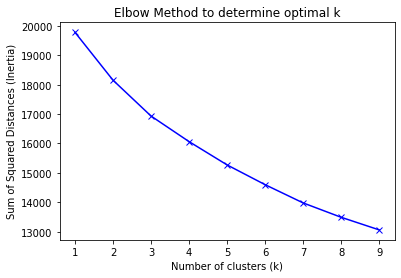

In [9]:
sum_squared_distances = []

K = range(1,10)
for num_clusters in K :
    kmeans = KMeans(n_clusters=num_clusters)
    kmeans.fit(df_positive_sentences['vec'].values.tolist())
    sum_squared_distances.append(kmeans.inertia_)

plt.plot(K, sum_squared_distances, 'bx-')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Sum of Squared Distances (Inertia)')
plt.title('Elbow Method to determine optimal k')
plt.show()

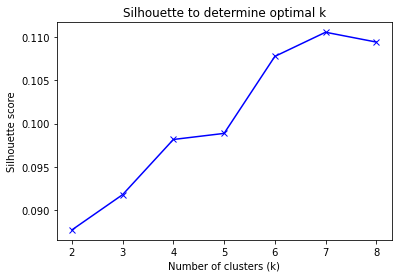

In [7]:
n_clusters_range = [2, 3, 4, 5, 6, 7, 8]
silhouette_avg = []

for num_clusters in n_clusters_range:

    # fit Kmeans
    kmeans = KMeans(n_clusters=num_clusters)
    kmeans.fit(df_positive_sentences['vec'].values.tolist())
    cluster_labels = kmeans.labels_

    # calculate silhouette
    silhouette_avg.append(silhouette_score(df_positive_sentences['vec'].values.tolist(), cluster_labels))

plt.plot(n_clusters_range, silhouette_avg, 'bx-')    
plt.xlabel('Number of clusters (k)')
plt.ylabel('Silhouette score')
plt.title('Silhouette to determine optimal k')
plt.show()

In [8]:
kmeans = KMeans(n_clusters=7)

In [9]:
df_positive_sentences['cluster'] = kmeans.fit_predict(df_positive_sentences['vec'].values.tolist())

In [10]:
def generate_wordcloud(df):
    text = ' '.join([str(i) for i in df['text_processed']])
    wordcloud = WordCloud(max_words=100, background_color='Black').generate(text)
    plt.figure(figsize=(12,12))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.show()

##### **Cluster 0**

In [11]:
cluster_0 = df_positive_sentences[df_positive_sentences['cluster']==0]

In [12]:
cluster_0.sample(5)

,text,review_index,text_processed,vec,cluster
383,centrico,77,centrico,"[-0.06390927, 0.08575017, -0.22828986, 0.03942...",0
12834,"A 3 minutos a pie de la calle Larios, que es l...",2288,3 minutos pie calle larios calle centrica malaga,"[-0.054173436, 0.04750782, -0.09068917, 0.0100...",0
9831,Parking justo al lado del hotel,1719,parking justo lado,"[-0.15617827, 0.07587131, -0.112732664, 0.0943...",0
29090,Hotel muy funcional que permite moverse por la...,5133,funcional permite moverse ciudad cerca estacio...,"[-0.063729554, 0.041953925, -0.069728136, 0.04...",0
17482,Perfecta ubicación!,3020,perfecta ubicacion,"[-0.020674646, 0.04601532, -0.14624818, 0.0423...",0


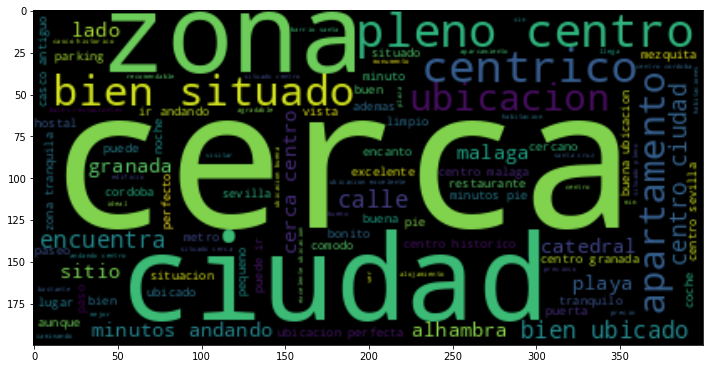

In [13]:
generate_wordcloud(cluster_0)

In [14]:
df_positive_sentences.loc[df_positive_sentences['cluster']==0, 'cluster'] = 'location'

In [15]:
n_sentences_c0 = len(cluster_0)
n_sentences = len(df_positive_sentences)
n_comments_c0 = cluster_0['review_index'].nunique()
n_comments = df_positive_sentences['review_index'].nunique()
perc_sentences_c0 = round(100*(n_sentences_c0/n_sentences))
perc_comments_c0 = round(100*(n_comments_c0/n_comments))

In [16]:
print(f'Total number of sentences (all clusters): {n_sentences}')
print(f'Number of sentences belonging to cluster 0: {n_sentences_c0}')
print(f'Percentage of sentences belonging to cluster 0: {perc_sentences_c0}')
print(f'Total number of comments: {n_comments}')
print(f'Number of comments that include sentences belonging to cluster 0: {n_comments_c0}')
print(f'Percentage of comments that include sentences belonging to cluster 0: {perc_comments_c0}')

Total number of sentences (all clusters): 78563
Number of sentences belonging to cluster 0: 10334
Percentage of sentences belonging to cluster 0: 13
Total number of comments: 9005
Number of comments that include sentences belonging to cluster 0: 5633
Percentage of comments that include sentences belonging to cluster 0: 63


##### **Cluster 1**

In [17]:
cluster_1 = df_positive_sentences[df_positive_sentences['cluster']==1]

In [18]:
cluster_1.sample(5)

,text,review_index,text_processed,vec,cluster
6281,¡Gran lugar!,1109,gran lugar,"[0.028872702, 0.10973741, -0.13174817, 0.06348...",1
11018,UN HOTEL CON ENCANTO PARA DISFRUTAR EN PAREJA,1963,encanto disfrutar pareja,"[-0.04937939, 0.2307122, -0.16647896, 0.034190...",1
39321,Elegimos este hotel para pasar una noche ya qu...,6852,elegimos pasar noche quedaba camino destino va...,"[-0.06666058, 0.18805964, -0.10598735, 0.08677...",1
4087,Nos ha encantado pasar allí una noche,749,encantado pasar alli noche,"[-0.07205317, 0.22228089, -0.14665109, 0.09846...",1
39487,"No me quiero enrollar en exceso, una maravilla",6885,no quiero enrollar exceso maravilla,"[-0.03535724, 0.20315607, -0.092140004, 0.0455...",1


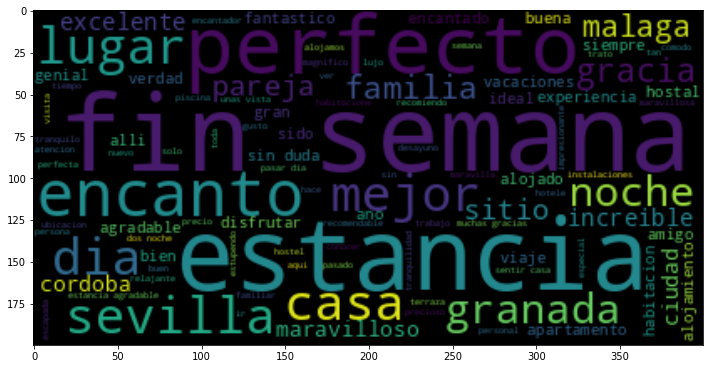

In [19]:
generate_wordcloud(cluster_1)

In [20]:
df_positive_sentences.loc[df_positive_sentences['cluster']==1, 'cluster'] = 'experience'

In [21]:
n_sentences_c1 = len(cluster_1)
n_comments_c1 = cluster_1['review_index'].nunique()
perc_sentences_c1 = round(100*(n_sentences_c1/n_sentences))
perc_comments_c1 = round(100*(n_comments_c1/n_comments))

In [22]:
print(f'Total number of sentences (all clusters): {n_sentences}')
print(f'Number of sentences belonging to cluster 1: {n_sentences_c1}')
print(f'Percentage of sentences belonging to cluster 1: {perc_sentences_c1}')
print(f'Total number of comments: {n_comments}')
print(f'Number of comments that include sentences belonging to cluster 1: {n_comments_c1}')
print(f'Percentage of comments that include sentences belonging to cluster 1: {perc_comments_c1}')

Total number of sentences (all clusters): 78563
Number of sentences belonging to cluster 1: 15846
Percentage of sentences belonging to cluster 1: 20
Total number of comments: 9005
Number of comments that include sentences belonging to cluster 1: 7070
Percentage of comments that include sentences belonging to cluster 1: 79


##### **Cluster 2**

In [23]:
cluster_2 = df_positive_sentences[df_positive_sentences['cluster']==2]

In [27]:
cluster_2.sample(5)

,text,review_index,text_processed,vec,cluster
32023,"y todo, en general todo esta super rico",5632,general super rico,"[-0.08931204, 0.08816953, -0.18481669, 0.02507...",2
39444,Muy buen precio,6875,buen precio,"[-0.10839746, 0.10760966, -0.18257855, 0.05274...",2
3844,Muy buena relación calidad-precio,709,buena relacion calidad precio,"[-0.06548256, 0.0857963, -0.14664891, 0.032623...",2
45419,El vino y la comida es excelente,7811,vino comida excelente,"[-0.04608221, 0.14463231, -0.15492745, 0.03447...",2
1881,"El personal del hotel, desde la administracion...",344,personal administracion camareros atentos amab...,"[-0.02713806, 0.26046336, -0.14595729, -0.0189...",2


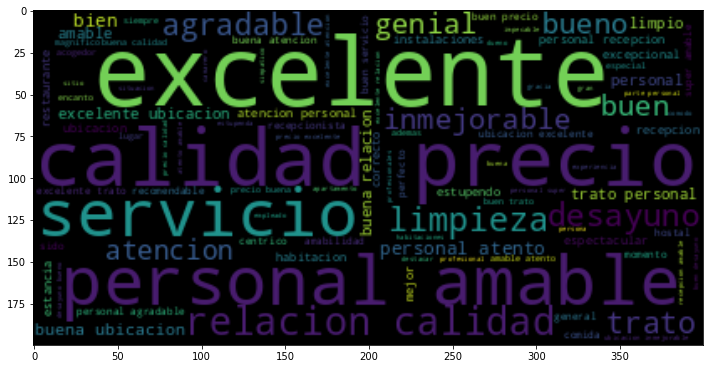

In [28]:
generate_wordcloud(cluster_2)

In [29]:
df_positive_sentences.loc[df_positive_sentences['cluster']==2, 'cluster'] = 'service and price'

In [30]:
n_sentences_c2 = len(cluster_2)
n_comments_c2 = cluster_2['review_index'].nunique()
perc_sentences_c2 = round(100*(n_sentences_c2/n_sentences))
perc_comments_c2 = round(100*(n_comments_c2/n_comments))

In [31]:
print(f'Total number of sentences (all clusters): {n_sentences}')
print(f'Number of sentences belonging to cluster 2: {n_sentences_c2}')
print(f'Percentage of sentences belonging to cluster 2: {perc_sentences_c2}')
print(f'Total number of comments: {n_comments}')
print(f'Number of comments that include sentences belonging to cluster 2: {n_comments_c2}')
print(f'Percentage of comments that include sentences belonging to cluster 2: {perc_comments_c2}')

Total number of sentences (all clusters): 78563
Number of sentences belonging to cluster 2: 14248
Percentage of sentences belonging to cluster 2: 18
Total number of comments: 9005
Number of comments that include sentences belonging to cluster 2: 6881
Percentage of comments that include sentences belonging to cluster 2: 76


##### **Cluster 3**

In [33]:
cluster_3 = df_positive_sentences[df_positive_sentences['cluster']==3]

In [34]:
cluster_3.sample(5)

,text,review_index,text_processed,vec,cluster
31737,"Estuvimos solo una noche pero muy comodos, est...",5587,solo noche comodos centrico habitacion comoda ...,"[-0.047149103, 0.045874648, -0.09886598, 0.032...",3
20801,Habitación más grande de lo habitual con una c...,3686,habitacion grande habitual cama comoda,"[-0.03129647, -0.0715538, 0.0076648267, 0.0199...",3
43779,"Las habitaciones no son excesivas, pero se ada...",7548,habitaciones no excesivas adapta decoracion to...,"[-0.029879453, 0.09021387, -0.047619198, -0.01...",3
2618,La limpieza muy bien,482,limpieza bien,"[-0.014782369, 0.12734675, -0.16868116, -0.020...",3
32136,Con aire acondiconado en la habitacion y salon...,5650,aire acondiconado habitacion salon independien...,"[-0.06686983, 0.022128006, -0.056014463, 0.003...",3


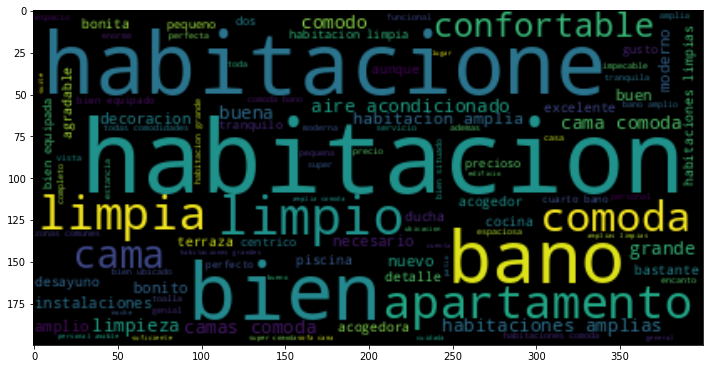

In [35]:
generate_wordcloud(cluster_3)

In [36]:
df_positive_sentences.loc[df_positive_sentences['cluster']==3, 'cluster'] = 'cleanliness and comfort'

In [37]:
n_sentences_c3 = len(cluster_3)
n_comments_c3 = cluster_3['review_index'].nunique()
perc_sentences_c3 = round(100*(n_sentences_c3/n_sentences))
perc_comments_c3 = round(100*(n_comments_c3/n_comments))

In [38]:
print(f'Total number of sentences (all clusters): {n_sentences}')
print(f'Number of sentences belonging to cluster 3: {n_sentences_c3}')
print(f'Percentage of sentences belonging to cluster 3: {perc_sentences_c3}')
print(f'Total number of comments: {n_comments}')
print(f'Number of comments that include sentences belonging to cluster 3: {n_comments_c3}')
print(f'Percentage of comments that include sentences belonging to cluster 3: {perc_comments_c3}')

Total number of sentences (all clusters): 78563
Number of sentences belonging to cluster 3: 11258
Percentage of sentences belonging to cluster 3: 14
Total number of comments: 9005
Number of comments that include sentences belonging to cluster 3: 6021
Percentage of comments that include sentences belonging to cluster 3: 67


##### **Cluster 4**

In [39]:
cluster_4 = df_positive_sentences[df_positive_sentences['cluster']==4]

In [40]:
cluster_4.sample(5)

,text,review_index,text_processed,vec,cluster
50987,Repetiría sin duda!,8700,repetiria sin duda,"[0.06650457, 0.046419512, -0.09290277, -0.0454...",4
21900,Siempre repetiría si mi visita a Cádiz es en i...,3752,siempre repetiria visita cadiz invierno,"[-0.009693308, 0.1046311, -0.058126193, -0.026...",4
33611,Hotel muy recomendable,5900,recomendable,"[-0.02770304, 0.12726003, -0.22891082, 0.02353...",4
51916,Volvere,8815,volvere,"[0.056742907, 0.16796343, -0.09099847, -0.0631...",4
5295,100% recomendable,952,100 recomendable,"[-0.014179367, 0.07519934, -0.192173, -0.01578...",4


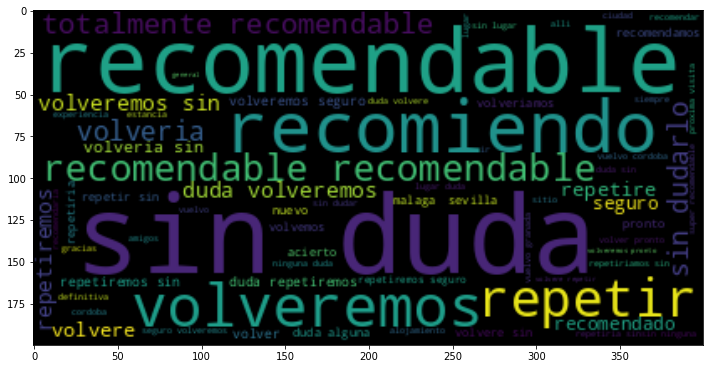

In [41]:
generate_wordcloud(cluster_4)

In [42]:
df_positive_sentences.loc[df_positive_sentences['cluster']==4, 'cluster'] = 'recommend and revisit'

In [43]:
n_sentences_c4 = len(cluster_4)
n_comments_c4 = cluster_4['review_index'].nunique()
perc_sentences_c4 = round(100*(n_sentences_c4/n_sentences))
perc_comments_c4 = round(100*(n_comments_c4/n_comments))

In [44]:
print(f'Total number of sentences (all clusters): {n_sentences}')
print(f'Number of sentences belonging to cluster 4: {n_sentences_c4}')
print(f'Percentage of sentences belonging to cluster 4: {perc_sentences_c4}')
print(f'Total number of comments: {n_comments}')
print(f'Number of comments that include sentences belonging to cluster 4: {n_comments_c4}')
print(f'Percentage of comments that include sentences belonging to cluster 4: {perc_comments_c4}')

Total number of sentences (all clusters): 78563
Number of sentences belonging to cluster 4: 5328
Percentage of sentences belonging to cluster 4: 7
Total number of comments: 9005
Number of comments that include sentences belonging to cluster 4: 4218
Percentage of comments that include sentences belonging to cluster 4: 47


##### **Cluster 5**

In [45]:
cluster_5 = df_positive_sentences[df_positive_sentences['cluster']==5]

In [49]:
cluster_5.head(5)

,text,review_index,text_processed,vec,cluster
5,Es algo más caro que otros hoteles de categorí...,1,caro hoteles categoria similar misma zona,"[-0.04587333, 0.10934289, -0.068289846, 0.0086...",5
6,"Aún así, es recomendable",1,aun asi recomendable,"[-0.026378836, 0.11449983, -0.092908315, -0.03...",5
14,Personal super atento Es un poco complicado ll...,3,personal super atento complicado llegar habita...,"[-0.045546073, 0.1776551, -0.1196878, 0.053322...",5
16,La localización perfecta la en mitad del barri...,4,localizacion perfecta mitad barrio cruz garaje...,"[-0.06636868, 0.082998656, -0.0704945, 0.02346...",5
23,Lástima que no tuvimos de disfrutar de la terr...,5,lastima no disfrutar terraza oportunidad piscina,"[-0.070234165, 0.11937484, -0.04685314, 0.0105...",5


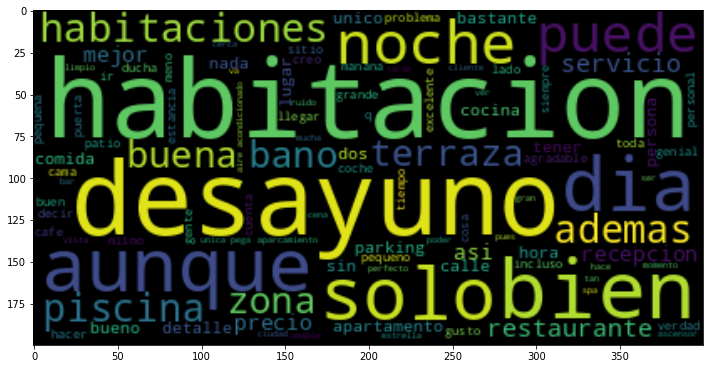

In [50]:
generate_wordcloud(cluster_5)

In [58]:
df_positive_sentences.loc[df_positive_sentences['cluster']==5, 'cluster'] = 'amenities'

In [59]:
n_sentences_c5 = len(cluster_5)
n_comments_c5 = cluster_5['review_index'].nunique()
perc_sentences_c5 = round(100*(n_sentences_c5/n_sentences))
perc_comments_c5 = round(100*(n_comments_c5/n_comments))

In [60]:
print(f'Total number of sentences (all clusters): {n_sentences}')
print(f'Number of sentences belonging to cluster 5: {n_sentences_c5}')
print(f'Percentage of sentences belonging to cluster 5: {perc_sentences_c5}')
print(f'Total number of comments: {n_comments}')
print(f'Number of comments that include sentences belonging to cluster 5: {n_comments_c5}')
print(f'Percentage of comments that include sentences belonging to cluster 5: {perc_comments_c5}')

Total number of sentences (all clusters): 78563
Number of sentences belonging to cluster 5: 19200
Percentage of sentences belonging to cluster 5: 24
Total number of comments: 9005
Number of comments that include sentences belonging to cluster 5: 7017
Percentage of comments that include sentences belonging to cluster 5: 78


##### **Cluster 6**

In [51]:
cluster_6 = df_positive_sentences[df_positive_sentences['cluster']==6]

In [53]:
cluster_6.sample(5)

,text,review_index,text_processed,vec,cluster
30297,Dani y Ainhoa,5353,dani ainhoa,"[-0.059822664, 0.043428816, 0.028124344, -0.03...",6
41714,Give Brian and Sandra a ring and have a chat a...,7228,give brian and sandra ring and have chat and l...,"[-0.057009503, -0.030760908, -0.028106444, 0.0...",6
28790,La 53,5081,53,"[-0.051274, 0.10966455, -0.07621656, 0.0460328...",6
31795,"Had everything I needed, including fab toiletr...",5597,had everything i needed including fab toiletri...,"[-0.041105453, -0.042559236, 0.020534698, 0.01...",6
13671,One night stay,2430,one night stay,"[-0.028993925, -0.0471051, 0.011303579, 0.0329...",6


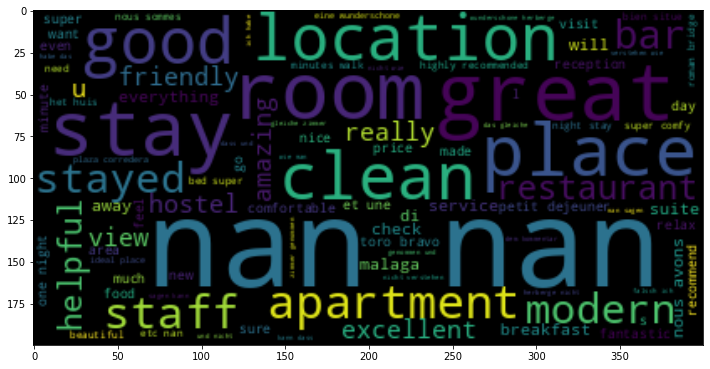

In [54]:
generate_wordcloud(cluster_6)

In [57]:
df_positive_sentences.loc[df_positive_sentences['cluster']==6, 'cluster'] = 'empty and not in spanish'

In [55]:
n_sentences_c6 = len(cluster_6)
n_comments_c6 = cluster_6['review_index'].nunique()
perc_sentences_c6 = round(100*(n_sentences_c6/n_sentences))
perc_comments_c6 = round(100*(n_comments_c6/n_comments))

In [56]:
print(f'Total number of sentences (all clusters): {n_sentences}')
print(f'Number of sentences belonging to cluster 6: {n_sentences_c6}')
print(f'Percentage of sentences belonging to cluster 6: {perc_sentences_c6}')
print(f'Total number of comments: {n_comments}')
print(f'Number of comments that include sentences belonging to cluster 6: {n_comments_c6}')
print(f'Percentage of comments that include sentences belonging to cluster 6: {perc_comments_c6}')

Total number of sentences (all clusters): 78563
Number of sentences belonging to cluster 6: 2349
Percentage of sentences belonging to cluster 6: 3
Total number of comments: 9005
Number of comments that include sentences belonging to cluster 6: 859
Percentage of comments that include sentences belonging to cluster 6: 10


##### **Save csv**

In [61]:
df_positive_sentences.to_csv('../data/processed/positive_sentences_clusters.csv')

##### **Comments and sentences distribution**

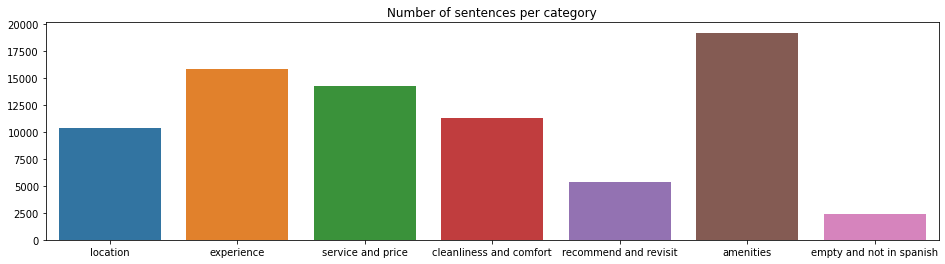

In [67]:
sentences_clusters = ['location', 'experience', 'service and price', 'cleanliness and comfort', 'recommend and revisit', 'amenities', 'empty and not in spanish']
n_sentences = [n_sentences_c0, n_sentences_c1, n_sentences_c2, n_sentences_c3, n_sentences_c4, n_sentences_c5, n_sentences_c6]
plt.figure(figsize=(16,4))
sns.barplot(x=sentences_clusters, y=n_sentences)
plt.title('Number of sentences per category')
plt.show()

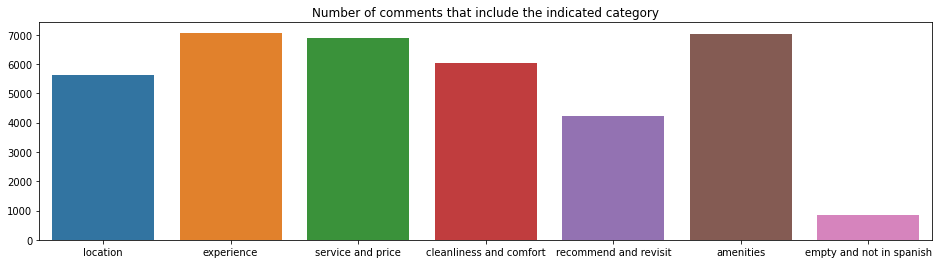

In [68]:
n_comments = [n_comments_c0, n_comments_c1, n_comments_c2, n_comments_c3, n_comments_c4, n_comments_c5, n_comments_c6]
plt.figure(figsize=(16,4))
sns.barplot(x=sentences_clusters, y=n_comments)
plt.title('Number of comments that include the indicated category')
plt.show()

##### **Clusters visualization**

In [69]:
# Main components to make 3D plot
pca = PCA(n_components=3)
df_positive_sentences['x'] = pca.fit_transform(df_positive_sentences['vec'].values.tolist())[:,0]
df_positive_sentences['y'] = pca.fit_transform(df_positive_sentences['vec'].values.tolist())[:,1]
df_positive_sentences['z'] = pca.fit_transform(df_positive_sentences['vec'].values.tolist())[:,2]

In [70]:
df_positive_sentences['cluster'] = df_positive_sentences['cluster'].astype('category')

In [73]:
fig = px.scatter_3d(df_positive_sentences, x='x', y='y', z='z', color='cluster')
fig.update_traces(marker_size = 2)
fig.show()

Reference:
https://towardsdatascience.com/making-sense-of-text-clustering-ca649c190b20#:~:text=For%20a%20refresh%2C%20clustering%20is,learn%20the%20pattern%20by%20itself.